In [1]:
import random
import numpy as np
import torch
import sys
import albumentations as A
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
# sys.path.append('/content/drive/MyDrive/CNS186_Final_Project/Files_from_Git/')
import data
import networks
import dt_utils
import net_utils
from torch.utils.data import TensorDataset
import random
import numpy as np
import torch
import albumentations as A
import torch.nn as nn
from torch.utils.data import TensorDataset
from PIL import Image
import torchvision.models as models
from torchvision import transforms
import matplotlib.pyplot as plt
from collections import OrderedDict
from data import GenRecogClassifyData_AD


/home/raaghav/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


Number of images in selected category: 40


/tmp/ipykernel_1901240/97673492.py:25: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  original = np.array(Image.open(img_path).convert("RGB"))


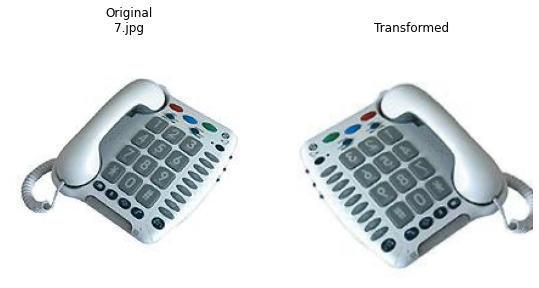

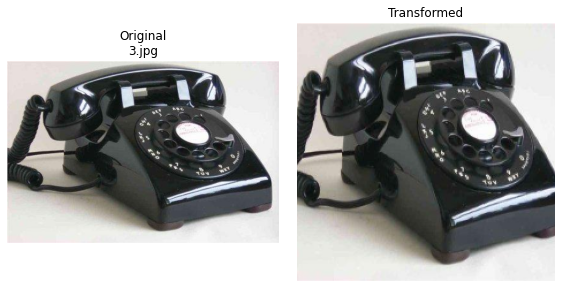

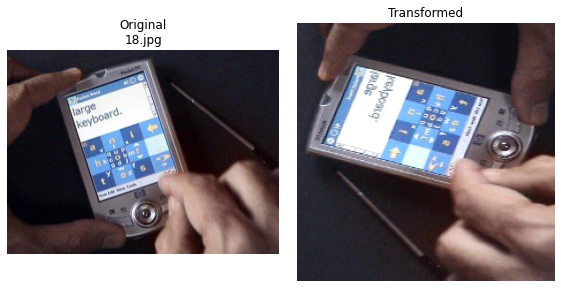

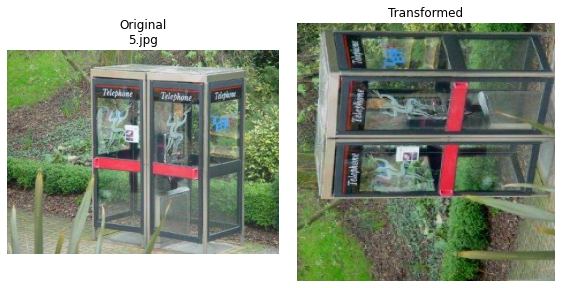

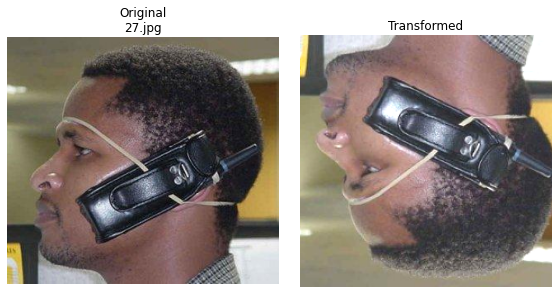

...

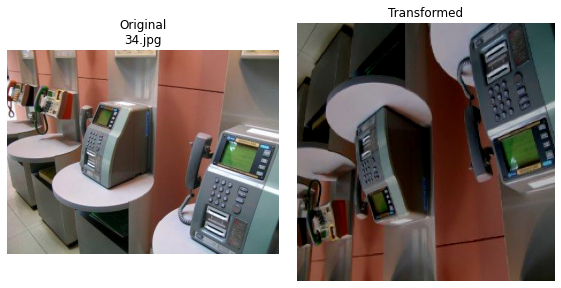

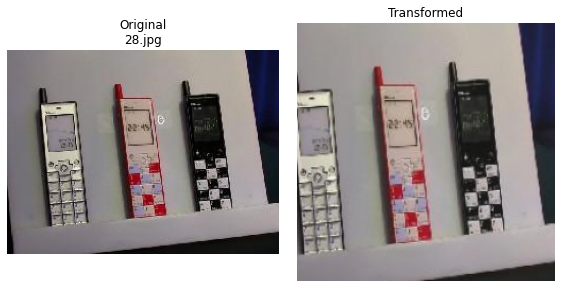

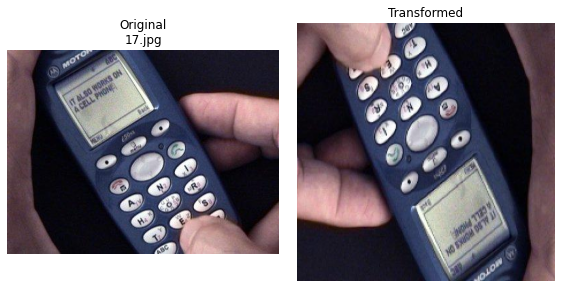

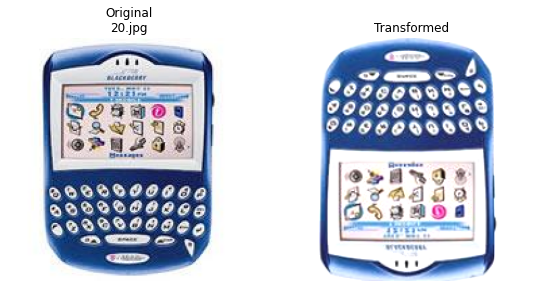

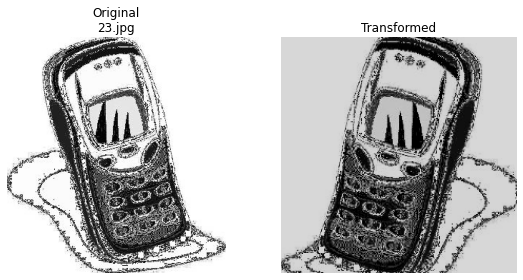

In [5]:
ROOT_DIR = "/home/raaghav/hebbff/Images/Stimuli/newolddelay/"
def is_image(fname):
    return fname.lower().endswith((".png", ".jpg", ".jpeg", ".bmp", ".tiff"))

# -------- Get random category --------
categories = [d for d in os.listdir(ROOT_DIR)
              if os.path.isdir(os.path.join(ROOT_DIR, d))]

category = random.choice(categories)
category_path = os.path.join(ROOT_DIR, category)

# -------- Get images for the chosen category --------
# Correctly list image files from the currently selected category_path
images = [os.path.join(category_path, f) for f in os.listdir(category_path) if is_image(f)]
print(f"Number of images in selected category: {len(images)}")

transform = A.Compose([
                A.RandomRotate90(),
                A.HorizontalFlip(p=0.5),
                A.RandomResizedCrop((224, 224), scale=(0.8, 1.0)),
                A.RandomBrightnessContrast(p=0.5),
            ])

for img_path in images:
    original = np.array(Image.open(img_path).convert("RGB"))
    augmented = transform(image=original)["image"]

    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(original)
    axes[0].set_title(f"Original\n{os.path.basename(img_path)}")
    axes[0].axis("off")

    axes[1].imshow(augmented)
    axes[1].set_title("Transformed")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()
